# 지도(Map) 학습
Folium
https://python-visualization.github.io/folium/latest/

자바스크립트(Leaflet.js)기반의 지도 라이브러리

* .Map(location=[위도, 경도], zoom_start=확대정도수치, tiles=지도스타일)
    - zoom_start : 보통 12
    - tiles : "OpenStreetMap"(기본값) / "CartoDB Positron"(밝은 그레이스케일)
                / "CartoDB Dark_Matter"(어두운 그레이스케일)
                / "https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}", attr="Google" (구글위성지도)
* .Marker([위도, 경도], popup="팝업문구", icon=아이콘정보)
* .Icon(color=, icon="아이콘이름")
    - icon 종류는 fontawesome에서 찾아서 해봐야함 (모두 다 되는건 아님)
    - 
* .add_to(지도변수명)


In [1]:
import folium

In [32]:
# 지도 열기기
my_map = folium.Map(location=[37.569398, 126.897253], zoom_start=12)
# 경도, 위도는 구글맵을 이용
# zoom_start 숫자가 클수록 확대가 더 많이 된 상태로 창이 시작됨
my_map.save("./results/my_map.html")
# 저장된 html 파일 열기 > vs code 하단 'Go Live'클릭 > 해당 주소의 구글맵이 열린다.

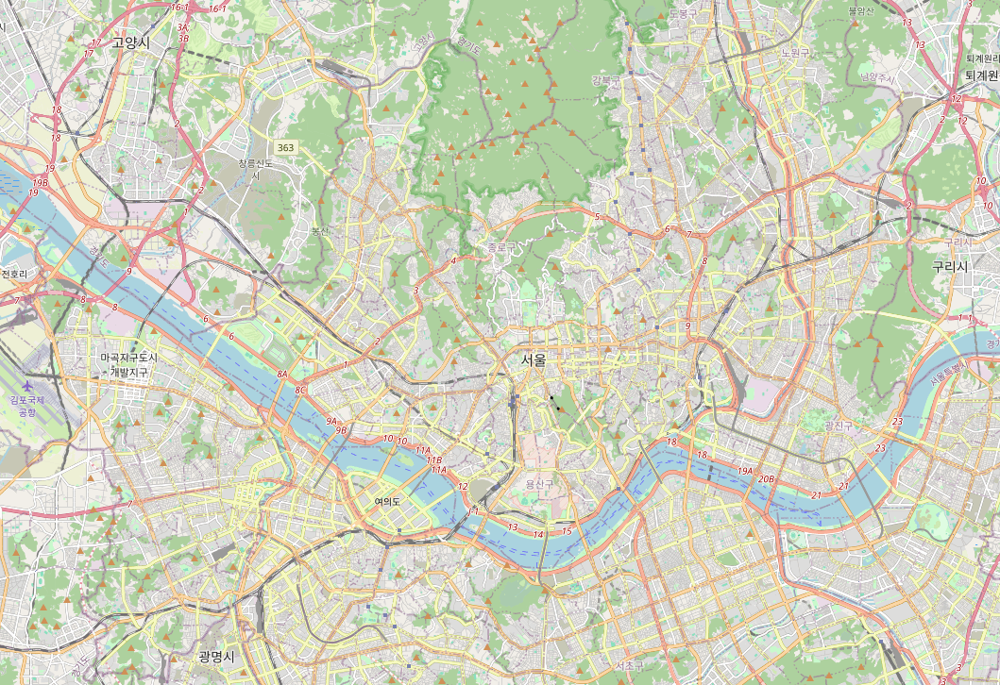

In [6]:
# 지도 스타일 추가 : Positron : 그레이스케일의 심플 지도도
my_map = folium.Map(location=[37.569398, 126.897253], zoom_start=12, tiles="CartoDB Positron")
my_map.save("./results/my_map_Positron.html")


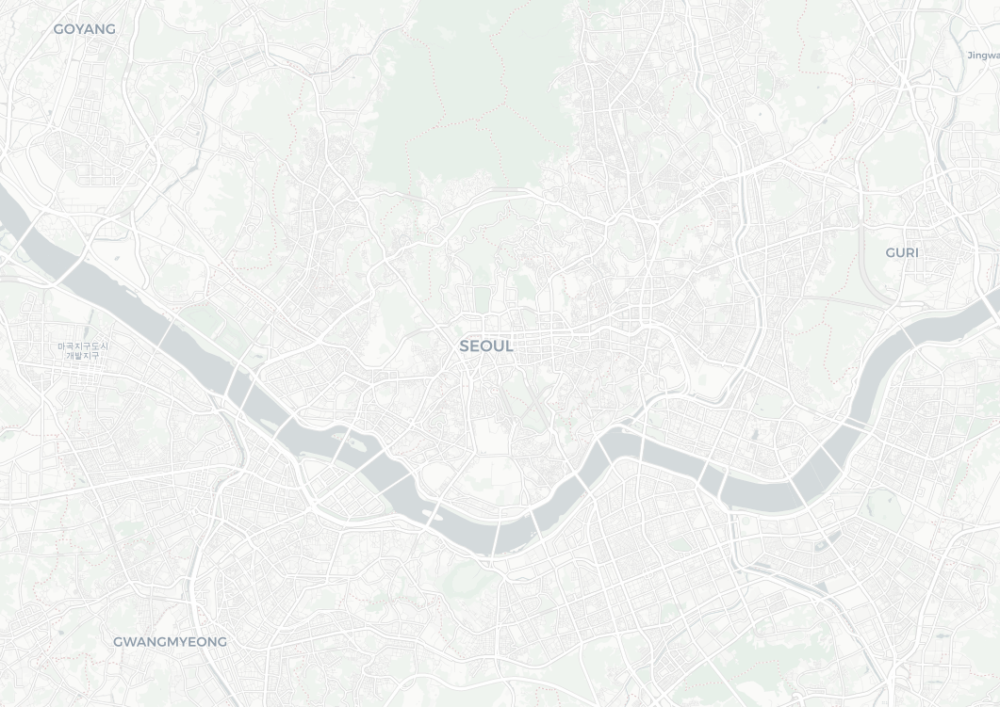

In [7]:
# 지도 스타일 추가 : Darkmatter : 어두운 배경에 도시와 도로 강조조
my_map = folium.Map(location=[37.569398, 126.897253], zoom_start=12, tiles="CartoDB Dark_Matter")
my_map.save("./results/my_map_DarkMatter.html")


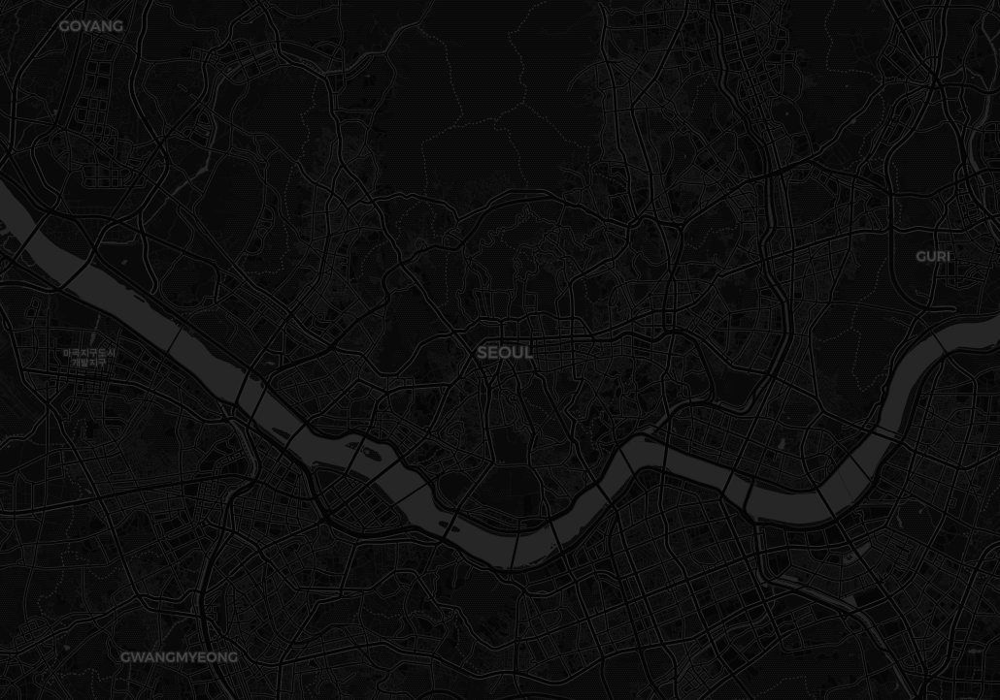

In [ ]:
# 지도에 마커 추가
my_map = folium.Map(location=[37.569398, 126.897253], zoom_start=12, 
                    tiles="https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}",
                    attr="Google")      # 구글 위성지도에 표시
# 기본마크
folium.Marker([37.582250, 126.976809], popup='경복궁').add_to(my_map)
# 마커 꾸미기 ㅡ 빨간 집 모양의 마커
folium.Marker([37.568046, 127.009791], popup='동대문디자인플라자', icon=folium.Icon(color='red', icon='home')).add_to(my_map)

my_map.save("./results/my_map_withMarker.html")


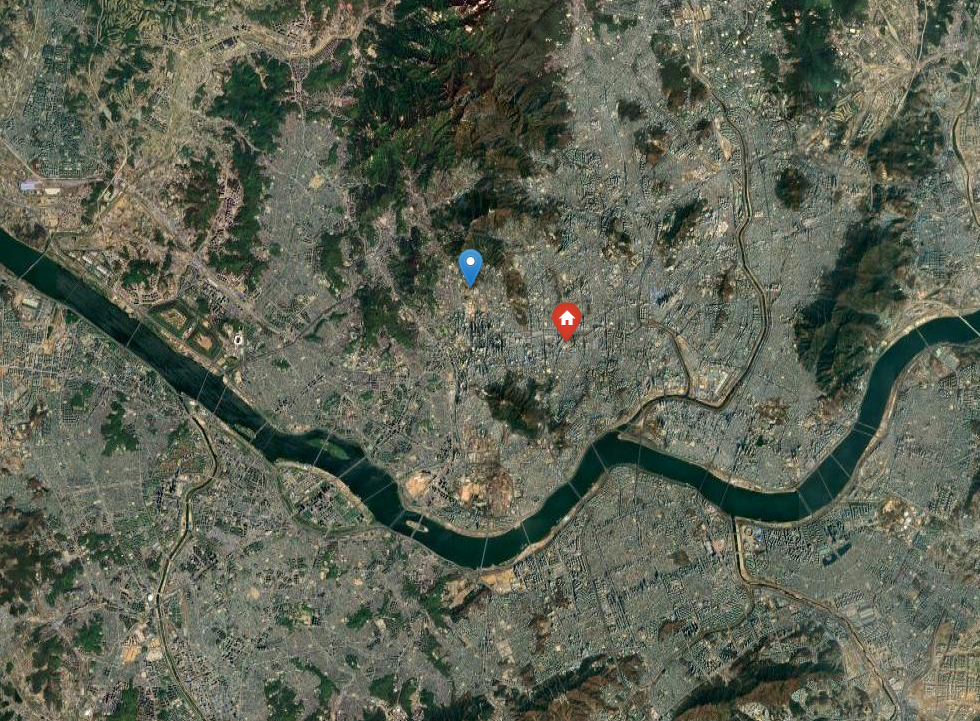

In [ ]:
# 지도에 영역 표시
my_map = folium.Map(location=[37.525432, 126.980578], zoom_start=13, 
                    tiles="CartoDB Positron")
# 영역표시 (원형)
# location : 영역의 중심 위치
folium.Circle(location=[37.521465, 126.939782], 
              redius=500, color='blue',
              popup="63빌딩",
              fill=True, fill_color='yellow').add_to(my_map)


my_map.save("./results/my_map_with_Circle.html")



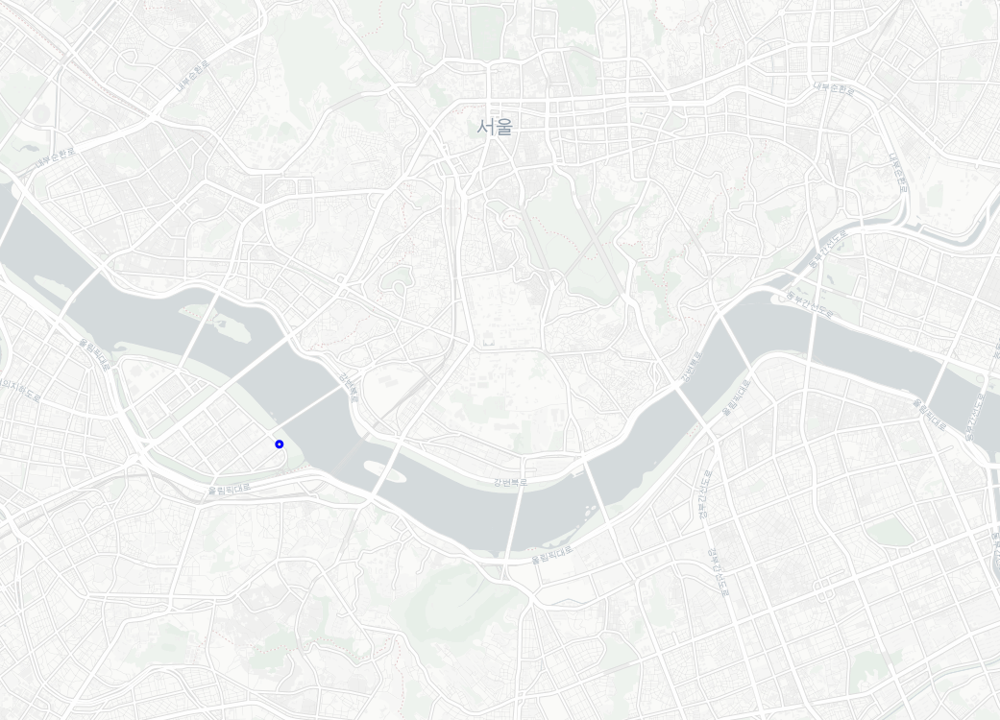

In [33]:
# 여러지역 마커 표시 (딕셔너리 이용)
my_map = folium.Map(location=[37.525432, 126.980578], zoom_start=13, 
                    tiles="CartoDB Positron")

map_info=[
    {"location" : [37.522933, 126.924445], "popup" : "여의도역"},
    {"location" : [37.529419, 127.009047], "popup" : "한남역"},
    {"location" : [37.554370, 126.968839], "popup" : "서울역"}
]

for info in map_info:
    folium.Marker(location=info['location'], popup=info['popup'], icon=folium.Icon(color='green', icon='star')).add_to(my_map)

my_map.save("./results/my_map_locations.html")


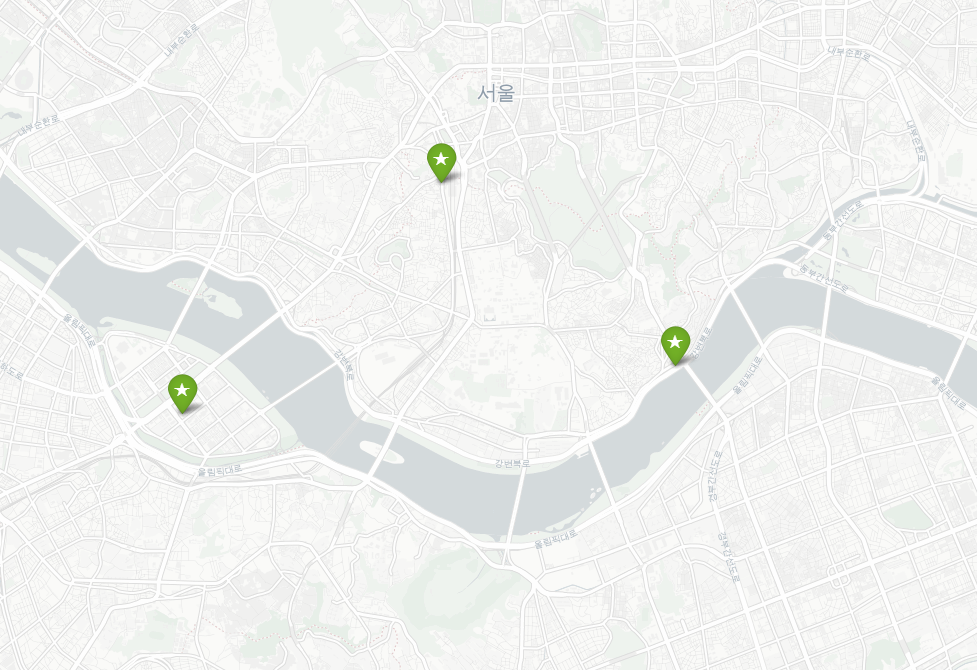

# 실습. folium 실습 문제
서울 지하철역 5개 선정하여 마커로 표시
1. 데이터 프레임으로 만들기
2. subway.csv파일로 만들기

In [31]:
import pandas as pd
import folium

subway = pd.DataFrame({
    "location" : [[37.522933, 126.924445], 
            [37.529419, 127.009047], 
            [37.554370, 126.968839],
            [37.504888, 127.048998],
            [37.559719, 126.942311]],
    "popup" : ["여의도역", "한남역", "서울역", "선릉역", "신촌역"]
})


my_map = folium.Map(location=[37.525432, 126.980578], zoom_start=13, 
                    tiles="CartoDB Positron")

for idx in subway.index:
    folium.Marker(location=subway['location'][idx], popup=subway['popup'][idx], 
                  icon=folium.Icon(color='green', icon='star')).add_to(my_map)

my_map.save("./results/my_map_SeoulStation_5.html")

subway.to_csv("./results/subway.csv", index=False)



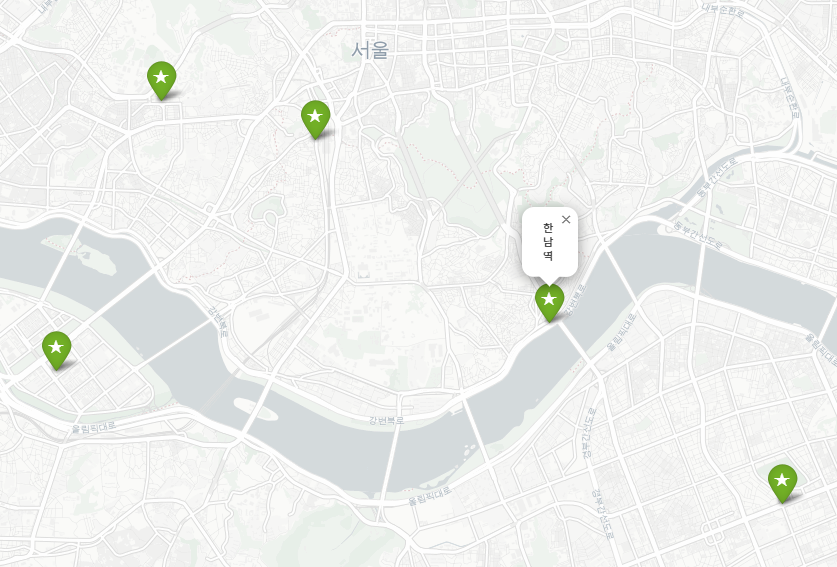,
![image-2.png](attachment:image-2.png)

In [39]:
# 실습 - 리더님 코드
import pandas as pd
import folium

# 서울 지하철 5개 위도, 경도
data = {
    "Station" : ['서울역', '공덕역', '응암역', '홍대입구역', '디지털미디어시티역'],
    "Latitude" : [37.565948, 37.543407, 37.598642, 37.556946, 37.576440],       # 위도
    "Longitude" : [126.967592, 126.951651, 126.915624, 126.923383, 126.901368]  # 경도
}

subway = pd.DataFrame(data)
# CSV파일 저장
subway.to_csv("./results/subway.csv", index=False, encoding="EUC-KR")

# Folium 지도 제작
my_map = folium.Map(location=[37.572993, 126.940459], zoom_start=13, 
                    tiles="CartoDB Positron")
subway.apply(lambda x : folium.Marker(
    location=[x['Latitude'], x['Longitude']],
    popup=x['Station'], 
    icon=folium.Icon(color='b', icon='train_subway')).add_to(my_map),
    axis=1
    )

my_map.save("./results/my_map_leaders_code.html")


C:\Users\praye\AppData\Local\Temp\ipykernel_81752\2985492378.py:22: UserWarning: color argument of Icon should be one of: {'blue', 'orange', 'white', 'green', 'cadetblue', 'darkpurple', 'darkred', 'lightgreen', 'pink', 'purple', 'black', 'gray', 'lightgray', 'darkblue', 'darkgreen', 'beige', 'lightblue', 'lightred', 'red'}.
  icon=folium.Icon(color='b', icon='train_subway')).add_to(my_map),


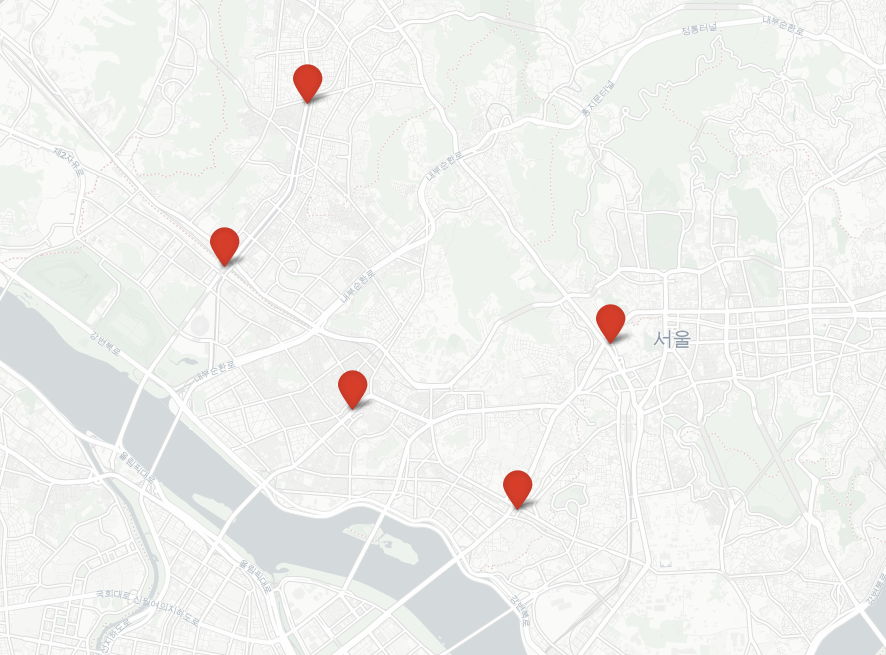

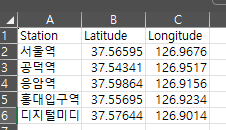

In [ ]:
# 데이터프레임의 헹단위 반복하면서 인덱스와 행의 쌍을 반환하는 함수
# .iterrow()

for index, row in subway.iterrows():
    